<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW5_boosting_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## **Домашняя работа 5: Бустинг и кластеризация**

### **Постановка задачи:**

В этой работы ваша задача подразделена на части:

*   В первой части вам предстоит реалищовать класс бустинга и сравнить его со встроенными классами популярных библиотек;
*   Во второй части вам предстоит применить алгоритмы кластеризации в задаче  разделения изображения на семантические компоненты;

### **Оценивание:**

- Как всегда оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.
- Брать код из открытых источников позволительно. Следование культуре цитирования **обязательно.**

### **Баллы:**

Суммарно за задание можно получить 10 основных и 1 бонусный балл.

Оценка за ДЗ = min{ваш балл, 10}

**Мягкий дедлайн: 16 февраля 23:59**

**Интересной вам работы!**

## **Часть 1: построение класса алгоритма бустинга**

**Количество баллов:** 7

Начнём с нужных библиотек и загрузки данных. Работать будем с датасетом из Kaggle и с синтетическим датасетом.

Данные c Kaggle связаны с телефонной рекламой португальского банковского учреждения. Цель классификации — спрогнозировать, подпишется ли клиент на срочный депозит (переменная y).

Всего в данных 20 признаков, ознакомиться с признаковым описанием можно [здесь](https://www.kaggle.com/code/sachinrajput17/subscription-prediction-for-bank-marketing-data).

Будем действовать из предположений, что датасет достаточно хорош, чтобы мы уже могли построить на нём базовую модель.

In [10]:
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, accuracy_score, f1_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingClassifier

ValueError: All ufuncs must have type `numpy.ufunc`. Received (<ufunc 'sph_legendre_p'>, <ufunc 'sph_legendre_p'>, <ufunc 'sph_legendre_p'>)

In [8]:
!wget  -O 'bank_data.csv' -q 'https://www.dropbox.com/s/uy27mctxo0gbuof/bank_data.csv?dl=0'

In [9]:
df = pd.read_csv('bank_data.csv')
df.sample(5)

NameError: name 'pd' is not defined

Разделим на train и test (random_state не меняем)

In [8]:
df_train, df_test = train_test_split(df, test_size=0.2, random_state=42)

NameError: name 'train_test_split' is not defined

Генерируем синтетические данные (seed не меняем)

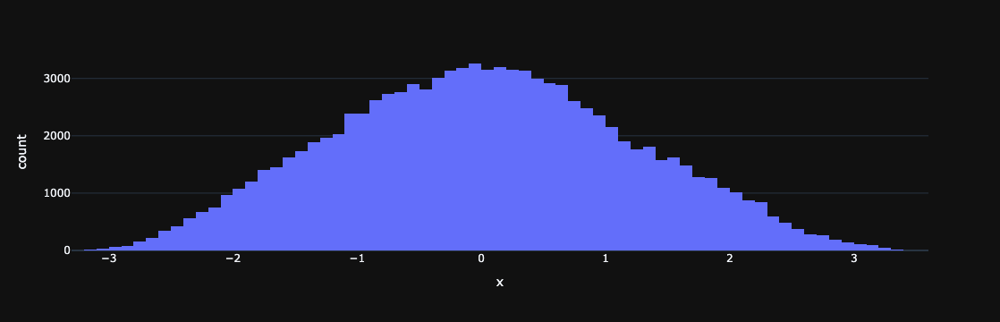

In [11]:
np.random.seed(42)

num_obs = 10 ** 5
num_thresholds = 50

X_synthetic = np.random.normal(scale=3, size=[num_obs, 2])
x1_thresholds = np.random.choice(X_synthetic[:, 0], num_thresholds, False)
x2_thresholds = np.random.choice(X_synthetic[:, 1], num_thresholds, False)

gains = np.random.uniform(-0.4086, 0.5, size=[2 * num_thresholds, 1])
x1_thresholds_cond = [X_synthetic[:, 0] >= threshold for threshold in x1_thresholds]
x2_thresholds_cond = [X_synthetic[:, 1] >= threshold for threshold in x2_thresholds]

noise = np.random.uniform(-0.5, 0.5, size=num_obs)

y_synthetic_probits = np.sum(
    gains[:num_thresholds] * x1_thresholds_cond + gains[num_thresholds:] * x2_thresholds_cond, axis=0
) + noise
y_synthetic = np.sign(y_synthetic_probits)

X_train_synthetic, y_train_synthetic = X_synthetic[:int(num_obs * 0.8)], y_synthetic[:int(num_obs * 0.8)]
X_test_synthetic, y_test_synthetic = X_synthetic[int(num_obs * 0.8):], y_synthetic[int(num_obs * 0.8):]

px.histogram(x = y_synthetic_probits, nbins=100)

Некоторый полезный код для визуализации предсказаний (пригодится позже)

In [12]:
import matplotlib.pyplot as plt

def plot_predicts(model, features, targets, x_lim=[-15.0, 15.0], y_lim=[-15.0, 15.0],
                  examples_density=0.01, steps=1000, num_ticks=6, title='', mode='classification'):
    '''
    Функция для визуализации предсказаний модели на двухмерной плоскости
    param model: обученная модель классификации или регрессии для двухмерных объектов
    param features: признаки выборки (a.k.a. X)
    param targets: целевая переменная выборки (a.k.a y)
    param x_lim: пределы для x
    param y_lim: пределы для y
    param examples_density: доля выборки, которая будет нарисована
    param steps: частота разбиения плоскости
    param num_ticks: число подписей на графике
    param title: заголовок графика
    param mode: режим 'classification' - вероятности положительного класса
                режим 'regression' - вещественная целевая переменная
    '''


    mask = np.random.choice([True, False], size=features.shape[0],
                            p=[examples_density, 1.0 - examples_density])
    features_x = (features[mask, 0] - x_lim[0]) / (x_lim[1] - x_lim[0]) * steps
    features_y = (features[mask, 1] - y_lim[0]) / (y_lim[1] - y_lim[0]) * steps

    xs = np.linspace(x_lim[0], x_lim[1], steps)
    ys = np.linspace(y_lim[0], y_lim[1], steps)

    xs, ys = np.meshgrid(xs, ys)
    grid = np.stack([xs.flatten(), ys.flatten()], axis=1)

    # Получаем вероятности без индексации второго столбца
    predicts = model.predict_proba(grid).reshape(steps, steps)
    values = (targets[mask] == 1).astype(float)

    plt.figure(figsize=(10, 10))
    plt.imshow(predicts, origin='lower')
    plt.scatter(features_x, features_y, c=values, edgecolors='white', linewidths=1.5)
    plt.colorbar()

    plt.xticks(np.linspace(0, steps, num_ticks), np.linspace(x_lim[0], x_lim[1], num_ticks))
    plt.yticks(np.linspace(0, steps, num_ticks), np.linspace(y_lim[0], y_lim[1], num_ticks))
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(title)
    plt.grid()
    plt.show()

### **Задание 1. (4 балла) Реализуйте бустинг для задачи бинарной классификации**

Реализовывать класс буситнга необходимо согласно его теоретическому описанию. Вы начинаете с параметрами:

- `base_model_class=DecisionTreeRegressor` — базовая модель
- `base_model_params: dict={'max_features': 0.1}` — параметрмы базовой модели, рассчет максимального количества признаков полагаем как: `max(1, int(max_features * n_features_in_))`
- `n_estimators: int=10` — количество моделей
- `learning_rate: float=0.1` — скорость обучения
- `subsample: float=0.3` — доля данных, которая будет использоваться для подбора отдельных алгоритмов.
— `random_seed: int=228` — тут как всегда
– `custom_loss: list or tuple=None` — функция потерь
— `use_best_model: bool=False` — использовать ли при вызове predict и predict_proba лучшее с точки зрения валидационной выборки число деревьев в композиции
— `n_iter_early_stopping: int=None` — ранний критерий остановки

**Примечание:**

Поскольку градиентный бустинг обучается через последовательное создание моделей, может получиться так, что оптимальная с точки зрения генерализации модель будет получена на промежуточной итерации. Обычно для контроля такого поведения в методе `fit` передается также валидационная выборка, по которой можно оценивать общее качество модели в процессе обучения (желательно делать это каждую итерацию, но если ваша имплементация слишком медленная или ваше железо не тянет, можно делать это реже).

**Примечание 2:**

Нет смысла обучать действительно глубокую модель на 1000 деревьев и больше, если оптимальный ансамбль получился, к примеру, на 70 итерации и в течение какого-то количества итераций не улучшился - поэтому мы также задействуем early stopping при отсутствии улучшений в течение некоторого числа итераций.

In [13]:
class Boosting:

    def __init__(
        self,
        base_model_class=DecisionTreeRegressor,
        base_model_params: dict={'max_features': 0.1},
        n_estimators: int=10,
        learning_rate: float=0.1,
        subsample: float=0.3,
        random_seed: int=228,
        custom_loss: list or tuple=None,
        use_best_model: bool=False,
        n_iter_early_stopping: int=None
    ):

        # Класс базовой модели
        self.base_model_class = base_model_class
        # Параметры для инициализации базовой модели
        self.base_model_params = base_model_params
        # Число базовых моделей
        self.n_estimators = n_estimators
        # Длина шага (которая в лекциях обозначалась через eta)
        self.learning_rate = learning_rate
        # Доля объектов, на которых обучается каждая базовая модель
        self.subsample = subsample
        # seed для бутстрапа, если хотим воспроизводимость модели
        self.random_seed = random_seed
        # Использовать ли при вызове predict и predict_proba лучшее
        # с точки зрения валидационной выборки число деревьев в композиции
        self.use_best_model = use_best_model
        # число итераций, после которых при отсутствии улучшений на валидационной выборке обучение завершается
        self.n_iter_early_stopping = n_iter_early_stopping

        # Место для нулевой модели
        self.initial_model_pred = None

        # Список для хранения весов при моделях
        self.gammas = []

        # Создаем список базовых моделей
        self.models = [self.base_model_class(**self.base_model_params) for _ in range(self.n_estimators)]

        # Если используем свою функцию потерь, ее нужно передать как список из loss-a и его производной
        if custom_loss is not None:
            self.loss_fn, self.loss_derivative = custom_loss
        else:
            self.sigmoid = lambda z: 1 / (1 + np.exp(-z))
            self.loss_fn = lambda y, z: -np.log(self.sigmoid(y * z)).mean()
            self.loss_derivative = lambda y, z: -y * self.sigmoid(-y * z)


    def _fit_new_model(self, X: np.ndarray, y: np.ndarray or list, n_model: int):
        """
        Функция для обучения одной базовой модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :param n_model: номер модели, которую хотим обучить
        """
        np.random.seed(self.random_seed + n_model)

        subsample_indices = np.random.choice(
            X.shape[0],
            size=int(X.shape[0] * self.subsample),
            replace=True
        )

        self.models[n_model].fit(X[subsample_indices], y[subsample_indices])


    def _fit_initial_model(self, X, y):
        """
        Функция для построения нулевой (простой) модели. Не забудьте взять логарифм, потому что сигмоида применяется
        уже к сумме предсказаний базовых моделей, а не к каждому предсказанию каждой модели по отдельности.
        Подойдёт константная модель, возвращающая самый популярный класс,
        но если хотите, можете сделать что-нибудь посложнее.
        """
        import numpy as np
        # For binary classification, using a simple log-odds model
        pos_count = np.sum(y == 1)
        neg_count = np.sum(y == -1)

        # Calculate log-odds for the initial prediction
        epsilon = 1e-10
        # Use scalar value for initial prediction
        self.initial_model_pred = float(np.log((pos_count + epsilon) / (neg_count + epsilon)))


    def _find_optimal_gamma(self, y: np.ndarray or list, old_predictions: np.ndarray,
                            new_predictions: np.ndarray, boundaries: tuple or list=(0.01, 1)):
        """
        Функция для поиска оптимального значения параметра gamma (коэффициент перед новой базовой моделью).
        :param y: вектор целевой переменной
        :param old_predictions: вектор суммы предсказаний предыдущих моделей (до сигмоиды)
        :param new_predictions: вектор суммы предсказаний новой модели (после сигмоиды)
        :param boudnaries: в каком диапазоне искать оптимальное значение ɣ (array-like объект из левой и правой границ)
        """
        # Определеяем начальные лосс и оптимальную гамму
        loss, optimal_gamma = self.loss_fn(y, old_predictions), 0
        # Множество, на котором будем искать оптимальное значение гаммы
        gammas = np.linspace(*boundaries, 100)
        # Простым перебором ищем оптимальное значение
        for gamma in gammas:
            predictions = old_predictions + gamma * new_predictions
            gamma_loss = self.loss_fn(y, predictions)
            if gamma_loss < loss:
                optimal_gamma = gamma
                loss = gamma_loss

        return optimal_gamma


    def fit(self, X, y, eval_set=None):
        """
        Функция для обучения всей модели бустинга
        :param X: матрица признаков
        :param y: вектор целевой переменной
        :eval_set: кортеж (X_val, y_val) для контроля процесса обучения или None, если контроль не используется
        """
        import numpy as np

        # Convert y to numpy array if it's a list
        y = np.array(y)

        # Store the number of features for feature_importances_
        self.n_features_in_ = X.shape[1]

        # Clear gammas list to support refit
        self.gammas = []

        # Variables for early stopping (not stored as attributes)
        best_iter = None
        best_score = float('inf')
        no_improvement_count = 0
        val_scores = []

        # Fit the initial model
        self._fit_initial_model(X, y)

        # Initialize predictions for all training samples
        current_predictions = np.full(y.shape, self.initial_model_pred)

        # If validation set is provided, evaluate initial model on it
        if eval_set is not None:
            X_val, y_val = eval_set
            y_val = np.array(y_val)
            val_initial_preds = np.full(y_val.shape, self.initial_model_pred)
            val_score = self.loss_fn(y_val, val_initial_preds)
            val_scores.append(val_score)
            best_score = val_score

        # Train each model
        for i in range(self.n_estimators):
            # Calculate negative gradients (residuals)
            negative_gradients = -self.loss_derivative(y, current_predictions)

            # Fit a new model to predict the negative gradients
            self._fit_new_model(X, negative_gradients, i)

            # Get predictions from the new model
            new_predictions = self.models[i].predict(X)

            # Find optimal gamma
            gamma = self._find_optimal_gamma(y, current_predictions, new_predictions)
            self.gammas.append(gamma)

            # Update current predictions
            current_predictions += self.learning_rate * gamma * new_predictions

            # If validation set is provided, perform early stopping check
            if eval_set is not None:
                # Make predictions for validation set
                val_preds = np.full(y_val.shape, self.initial_model_pred)
                for j in range(i + 1):
                    val_preds += self.learning_rate * self.gammas[j] * self.models[j].predict(X_val)

                # Calculate validation score
                val_score = self.loss_fn(y_val, val_preds)
                val_scores.append(val_score)

                # Check if this is the best model so far
                if val_score < best_score:
                    best_score = val_score
                    best_iter = i
                    no_improvement_count = 0
                else:
                    no_improvement_count += 1

                # Check early stopping
                if self.n_iter_early_stopping is not None and no_improvement_count >= self.n_iter_early_stopping:
                    print(f"Early stopping at iteration {i+1}, best iteration: {best_iter+1}")
                    break

        # Store best iteration for predict methods if using best model
        if self.use_best_model and eval_set is not None:
            self.best_iter = best_iter

        return self


    def predict(self, X: np.ndarray):
        """
        Функция для предсказания классов обученной моделью бустинга
        :param X: матрица признаков
        """
        probs = self.predict_proba(X)
        return (probs >= 0.5).astype(int) * 2 - 1  # probs -> class lbls (-1/1)

    def predict_proba(self, X: np.ndarray):
        """
        Функция для предсказания вероятностей классов обученной моделью бустинга
        :param X: матрица признаков
        """
        import numpy as np

        # Ensure initial_model_pred is used consistently
        if not isinstance(self.initial_model_pred, (int, float)):
            initial_pred = float(self.initial_model_pred)
        else:
            initial_pred = self.initial_model_pred

        # Create array of initial predictions
        predictions = np.full(X.shape[0], initial_pred)

        # Determine how many models to use
        if self.use_best_model and hasattr(self, 'best_iter') and self.best_iter is not None:
            n_models = self.best_iter + 1
        else:
            n_models = len(self.gammas)

        # Add predictions from each model
        for i in range(n_models):
            predictions += self.learning_rate * self.gammas[i] * self.models[i].predict(X)

        # Apply sigmoid to get probabilities
        return self.sigmoid(predictions)

    @property
    def feature_importances_(self):
        """
        Функция для вычисления важностей признаков.
        Вычисление должно проводиться после обучения модели
        и быть доступно атрибутом класса.
        """
        import numpy as np

        # Number of fitted models to use
        if self.use_best_model and hasattr(self, 'best_iter') and self.best_iter is not None:
            n_models = self.best_iter + 1
        else:
            n_models = len(self.gammas)

        importances = np.zeros(self.n_features_in_)

        for i in range(n_models):
            if hasattr(self.models[i], 'feature_importances_'):
                model_importance = self.models[i].feature_importances_
                importances += self.gammas[i] * self.learning_rate * model_importance

        if np.sum(importances) > 0:
            importances = importances / np.sum(importances)

        return importances

## **Тест для вашей имплементации.**

Если класс написан правильно, две следующие ячейки должна отработать без ошибок и относительно быстро (у автора задания 2 и 0.2 секунд соответственно, accuracy 0.911 и 0.879 соответственно). Если у вас получилось качество выше указанного — отлично!

In [14]:
%%time

boosting = Boosting()
boosting.fit(X_train_synthetic, y_train_synthetic)
# Без разницы, выдает эта строка классы или вероятности

preds = np.round(boosting.predict_proba(X_test_synthetic) > 0.5)

print(accuracy_score((y_test_synthetic == 1), preds))

0.91025
CPU times: user 1.08 s, sys: 60.5 ms, total: 1.14 s
Wall time: 1.15 s


In [15]:
%%time

boosting = Boosting()
boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
# Без разницы, выдает эта строка классы или вероятности
preds = np.round(boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values) > 0.5)

print(accuracy_score((df_test.y.values == 1), np.round(preds)) > 0.87)

True
CPU times: user 97.1 ms, sys: 3.74 ms, total: 101 ms
Wall time: 101 ms


### **Задание 2. (1.2 балла) Сравнение с базовыми моделями**

- Сравните результаты вашей имплементации бустинга, где в качестве базовых моделей используйте алгоритмы, перечисленные ниже. Сравнение проводите на обоих датасетах и ответьте на вопросы. Разумеется, надо измерять качество на тестовых данных. Данные берите из реальной задачи (bank_data).
- Ответьте на поставленные вопросы

Варианты для базовой модели (разумеется, не надо их программировать самостоятельно, берите нужные классы из sklearn):

- Решающее дерево глубины 6
- Случайный лес (число деревьев — на ваше усмотрение, только не слишком мало)
- Линейная регрессия

In [16]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import time

# Словарь для хранения результатов
results = {}

# Набор базовых моделей для сравнения
base_models = {
    "DecisionTree(depth=6)": (DecisionTreeRegressor, {"max_depth": 6}),
    "RandomForest(trees=50)": (RandomForestRegressor, {"n_estimators": 52, "max_depth": 6}),
    "LinearRegression": (LinearRegression, {})
}

In [17]:
for model_name, (model_class, model_params) in base_models.items():
    start_time = time.time()
    boosting = Boosting(base_model_class=model_class, base_model_params=model_params)
    boosting.fit(X_train_synthetic, y_train_synthetic)
    preds = boosting.predict(X_test_synthetic)
    acc = accuracy_score((y_test_synthetic == 1), (preds > 0))
    elapsed = time.time() - start_time

    results[f"synthetic_{model_name}"] = {"accuracy": acc, "time": elapsed}
    print(f"{model_name}: Accuracy = {acc:.4f}, Time = {elapsed:.2f} sec")

print("---real data---")
for model_name, (model_class, model_params) in base_models.items():
    start_time = time.time()
    boosting = Boosting(base_model_class=model_class, base_model_params=model_params)
    boosting.fit(df_train.select_dtypes(['int64', 'float64']).drop(columns='y').values, df_train.y.values)
    preds = boosting.predict(df_test.select_dtypes(['int64', 'float64']).drop(columns='y').values)
    acc = accuracy_score((df_test.y.values == 1), (preds > 0))
    elapsed = time.time() - start_time

    results[f"bank_{model_name}"] = {"accuracy": acc, "time": elapsed}
    print(f"{model_name}: Accuracy = {acc:.4f}, Time = {elapsed:.2f} sec")

DecisionTree(depth=6): Accuracy = 0.9145, Time = 0.99 sec
RandomForest(trees=50): Accuracy = 0.9159, Time = 11.71 sec
LinearRegression: Accuracy = 0.6893, Time = 0.89 sec
---real data---
DecisionTree(depth=6): Accuracy = 0.8858, Time = 0.11 sec
RandomForest(trees=50): Accuracy = 0.8917, Time = 1.42 sec
LinearRegression: Accuracy = 0.8308, Time = 0.08 sec


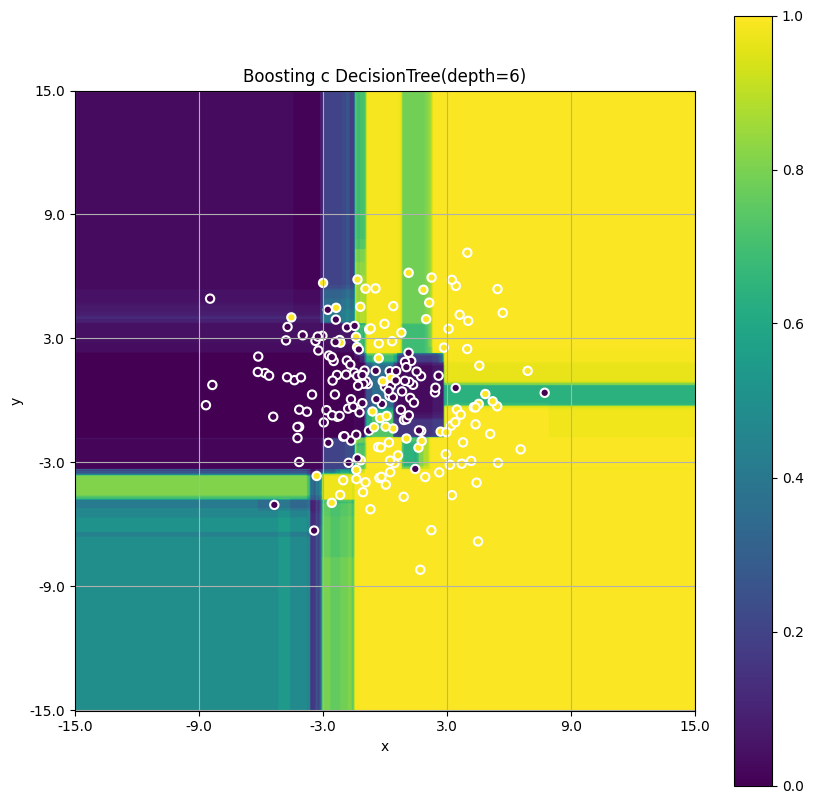

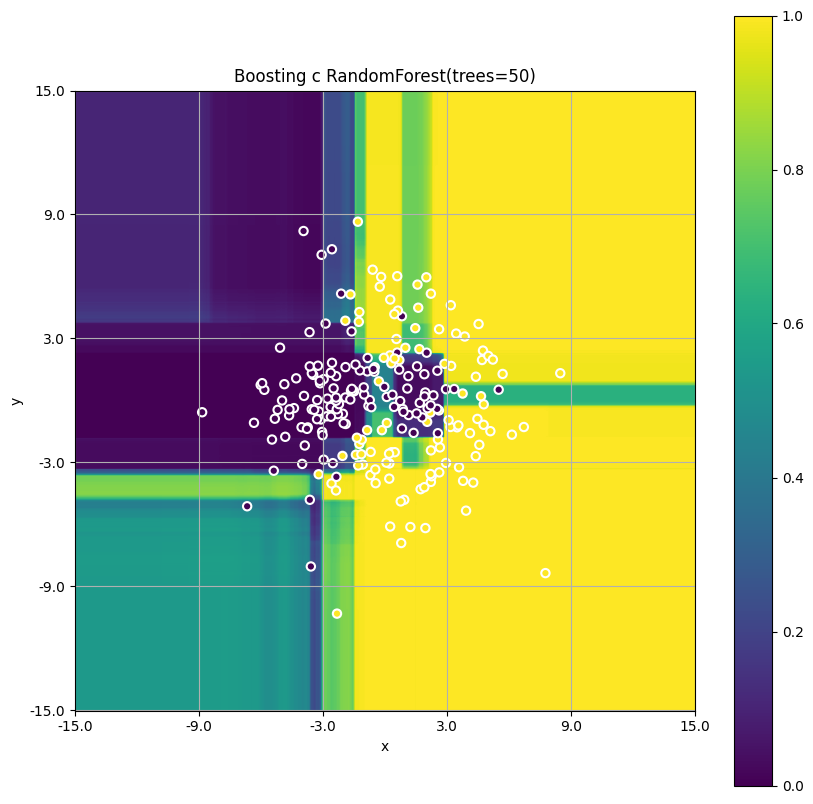

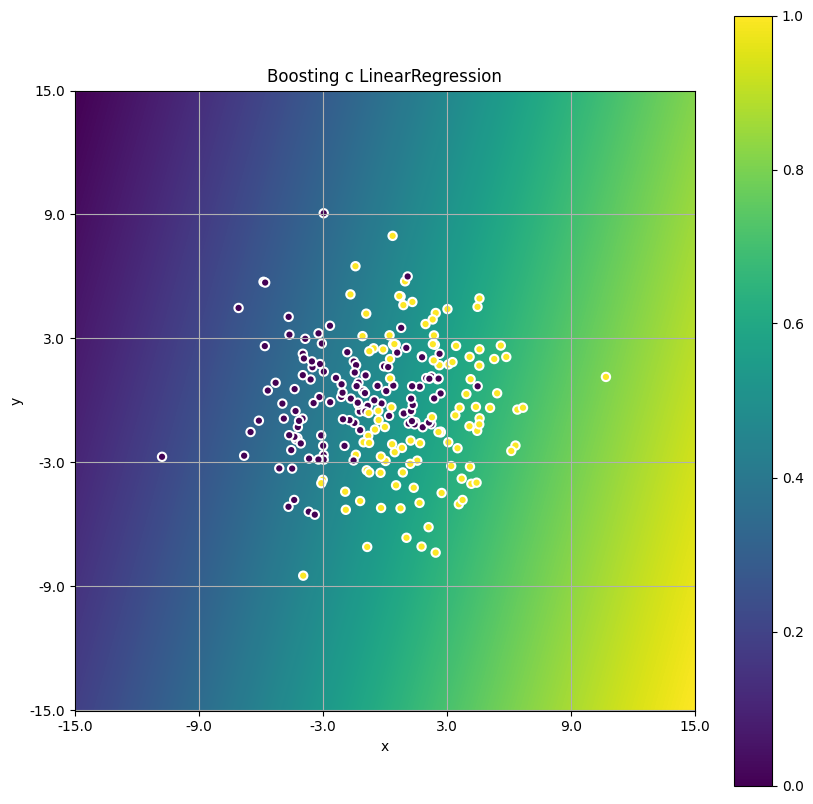

In [18]:
for model_name, (model_class, model_params) in base_models.items():
    # Создаем и обучаем модель бустинга
    boosting = Boosting(base_model_class=model_class, base_model_params=model_params)
    boosting.fit(X_train_synthetic, y_train_synthetic)

    # Визуализируем результаты
    plot_predicts(
        boosting,
        X_test_synthetic,
        y_test_synthetic,
        x_lim=[-15.0, 15.0],
        y_lim=[-15.0, 15.0],
        title=f'Boosting с {model_name}'
    )

**Вопросы:**

1) Какая из моделей имеет оптимальное качество? С чем это связано?
- RF показывает максимальную accuracy, тк он может снижать variance за счёт ансамблирования и устойчивости к шуму
2) Какая из моделей сильнее переобучается? Есть ли преимущества от использования ранней остановки и обрезания бустинга до лучшей модели?
- DT судя по снижению accuracy на bank data переобучилась. Использование early stopp может помочь предотвратить переобучение. Есть преимущества от использования ранней остановки и обрезания бустинга до лучшей модели.
3) Работает ли бустинг над линейными регрессиями лучше, чем одна логистическая регрессия? Как объяснить этот результат?
- Бустинг LinReg vs LogisticRegression: Бустинг на LinReg не даёт преимуществ по сравнению с одной LogReg, тк LinReg не оптимизирован для класификации и не умеет моделировать вероятностные границы аналогично LoпReg
4) Визуализируйте предсказания моделей только на синтетическом датасете (для этого можете воспользоваться вспомогательной функцией plot_predicts). Чем отличаются картинки, которые получаются у разных алгоритмов? Сделайте выводы.
- Модели на базе деревьев (DecisionTree, RandomForest) дают резкие ступенчатые, дискретные границы, отражающие разбиение пространства на регионы.
Boosting с LinearRegression имеет более сглаженные пороги. Бустинг с LinReg даёт сглаженные границы, тк итоговая модель (сумма линейных слабых предикторов) формирует непрерывную функцию, минимизирующую ошибку по всему пространству. Это приводит к плавным переходам между классами, в отличие от резких разбиений, создаваемых деревьями, которые бинарно делят пространство на регионы. В результате это подчеркивает, что выбор модели зависит от характера данных. Для явных дискретных разделений лучше подходят деревья, а для более плавных зависимостей уместны линейные модели

**Ваш ответ здесь**

### **Задание 3. (0.8 балла) Сравнение с бустингами**

- Сравните на реальных данных данных любую из трёх популярных имплементаций градиентного бустинга (xgboost, lightgbm, catboost) с вашей реализацией.
- Укажите, получилось ли у вас победить библиотечные реализации на тестовых данных?

**Примечание:**

Подберите основные гиперпараметры (число деревьев, длина шага, глубина дерева/число листьев) для обоих методов.


In [6]:


def evaluate_custom_boosting(base_model_class, base_model_params, X_train, y_train, X_test, y_test):
    start_time = time.time()
    boosting = Boosting(base_model_class=base_model_class, base_model_params=base_model_params)
    boosting.fit(X_train, y_train)
    preds = boosting.predict(X_test)
    # Преобразуем предсказания в бинарные (если модель выдаёт непрерывные значения)
    acc = accuracy_score((y_test == 1), (preds > 0))
    elapsed = time.time() - start_time
    return acc, elapsed

def evaluate_xgboost(X_train, y_train, X_test, y_test):
    import xgboost as xgb
    start_time = time.time()
    clf = xgb.XGBClassifier(
        n_estimators=100,  # число деревьев
        learning_rate=0.1,
        max_depth=6,
        use_label_encoder=False,
        eval_metric='logloss'
    )
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    acc = accuracy_score((y_test == 1), (preds == 1))
    elapsed = time.time() - start_time
    return acc, elapsed

def evaluate_lightgbm(X_train, y_train, X_test, y_test):
    import lightgbm as lgb
    start_time = time.time()
    clf = lgb.LGBMClassifier(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=6
    )
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    acc = accuracy_score((y_test == 1), (preds == 1))
    elapsed = time.time() - start_time
    return acc, elapsed

def evaluate_catboost(X_train, y_train, X_test, y_test):
    from catboost import CatBoostClassifier
    start_time = time.time()
    clf = CatBoostClassifier(
        iterations=100,
        learning_rate=0.1,
        depth=6,
        verbose=0
    )
    clf.fit(X_train, y_train)
    preds = clf.predict(X_test)
    acc = accuracy_score((y_test == 1), (preds.flatten() == 1))
    elapsed = time.time() - start_time
    return acc, elapsed

ValueError: All ufuncs must have type `numpy.ufunc`. Received (<ufunc 'sph_legendre_p'>, <ufunc 'sph_legendre_p'>, <ufunc 'sph_legendre_p'>)

In [7]:
base_model_class = DecisionTreeRegressor
base_model_params = {"max_depth": 6}

# Оценка вашей реализации Boosting
acc_custom, time_custom = evaluate_custom_boosting(base_model_class, base_model_params,
                                                     X_train_synthetic, y_train_synthetic,
                                                     X_test_synthetic, y_test_synthetic)

# Оценка xgboost
acc_xgb, time_xgb = evaluate_xgboost(X_train_synthetic, y_train_synthetic,
                                     X_test_synthetic, y_test_synthetic)

# Оценка lightgbm
acc_lgb, time_lgb = evaluate_lightgbm(X_train_synthetic, y_train_synthetic,
                                      X_test_synthetic, y_test_synthetic)

# Оценка catboost
acc_cat, time_cat = evaluate_catboost(X_train_synthetic, y_train_synthetic,
                                      X_test_synthetic, y_test_synthetic)

# Вывод результатов
print("Custom Boosting: Accuracy = {:.4f}, Time = {:.2f} sec".format(acc_custom, time_custom))
print("XGBoost:         Accuracy = {:.4f}, Time = {:.2f} sec".format(acc_xgb, time_xgb))
print("LightGBM:        Accuracy = {:.4f}, Time = {:.2f} sec".format(acc_lgb, time_lgb))
print("CatBoost:        Accuracy = {:.4f}, Time = {:.2f} sec".format(acc_cat, time_cat))

NameError: name 'DecisionTreeRegressor' is not defined

**Ваш ответ здесь**

###**Задание 4. (1 балл) Капля теории**

Теоретически, мы могли бы построить бэггинг на логистических регрессиях. Оцените целесообразность такого подхода. В ответе укажите:

- Идею бэггинга и его свойства;
- Характеристики модели логистической регресии;
- Сопоставление и вывод.


## **Часть 1: Разделение изображения на семантические компоненты**

**Количество баллов:** 3

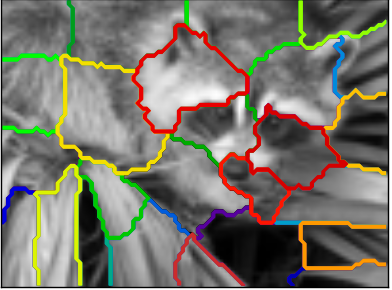

Алгоритмы кластеризации могут применяться в самых разных задачах. Например, в анализе изображений есть задача разделения изображения на семантические компоненты, которую можно решать в том числе с помощью алгоритмов кластеризации.

Проверим их на ```duck.jpg``` и ```owls.jpg```

### **Задание 5 (0.2 балла)**

Откройте изображения, после чего визуализируйте их с помощью ```plt.imshow()```

In [ ]:
from PIL import Image
# or
#import cv2

### **Задание 6 (0.8 балла)**

Для каждого изображения, используя кластеризацию ```KMeans```, выделите компоненты, охарактеризовав каждый пиксель следующим образом: $$\psi_i = [\lambda x_i, \lambda y_i, r_i, g_i, b_i]$$
 где
- $x_i$ и $y_i$ — координаты пикселя,
- $r_i, g_i, b_i$ — его цвет,
- $\lambda$ — параметр, выражающий важность пространственной связности перед цветовой похожестью.

- Примените полученную функцию, взяв следующие $\lambda$: 0.3 и 1.5 для ```duck.jpg``` и ```owls.jpg``` (или другие, но тогда с вас красивые результаты :))
- Проанализируйте результат

**Примечание:**
Число кластеров подберите разумным образом на свой вкус (в качестве нулевого приближения можно взять 3)

In [ ]:
def find_components(image, lmbd, n_clusters):
    # Ваш код здесь

**Ваш ответ здесь**

### **Задание 7 (0.8 балла)**

Попробуйте выделить сегменты при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering). Обратите внимание на [пример в sklearn](http://scikit-learn.org/0.16/auto_examples/cluster/plot_lena_segmentation.html).


**Примечание:**

Для ускорения работы алгоритма рекомендуется привести изображение к серому цвету. При необходимости можно сжать изображения в 2 раза.

**Подсказка:**```skimage``` с его ```color``` и ```transform``` в этом помогут :)

Или же воспользуйтесь аналогичными средствами ```PIL``` или ```cv2```

In [ ]:
def spectral_segmentation(image, n_clusters, beta, eps):
    #your code here

### **Задание 8 (0.2 балла)**
- Визуализируйте результаты сегментации (аналогично рисунку в начале задания 2) для обоих методов.
- Проанализируйте сравнение

In [ ]:
# Ваш код здесь

**Ваш ответ здесь**

### **Задание 9 (1 балл)**

- Найдите интересную картинку милого животного и примените алгоритмы и к ней. Поэкспериментируйте с параметрами алгоритмов и постарайтесь добиться оптимального результата. Картинку нужно будет загрузить вместе с работой.

- Сравните два подхода и сегментации, к которым они приводят. Для всех ли изображений в результате сегментации хорошо видны контуры объектов?

**Примечание:**

Слишком большие лучше не брать - считаться будет долго. Не забудьте визуализировать!


In [ ]:
# Ваш код здесь

**Ваш ответ здесь**

## **Бонус (1 балл)**

В качестве бонуса предлагаем вам построить алгоритм кластеризации типов движения на наборе Samsung Human Activity Recognition. Набор данных заранее предобработан и снова доступен вам по [ссылке](https://drive.google.com/file/d/16ISu7lMumt5rbticbOggHMRjwTGBETtO/view?usp=sharing).

### **Постановка задачи**
Данные поступают с акселерометров и гироскопов мобильных телефонов Samsung Galaxy S2. Вид активности человека с телефоном в кармане известен:
- 1 - ходьба,
- 2 - подъем вверх по лестнице,
- 3 - спуск по лестнице,
- 4 - сидение,
- 5 - стояние,
- 6 - лежание


Представим, что вид активности нам неизвестнен, и попробуем кластеризовать людей чисто на основе имеющихся признаков.

### **Задание 1 (0.05 балла)**
Прочитайте данные из файлов и объедните тестовую и обучающие выборки.

В файлах ```..._labels``` лежат настоящие классы. Их также объедините, но в отдельную переменную (например ```y```). Данный вектор для кластеризации нам не нужен, но мы будем смотреть по нему метрики.

In [ ]:
# Ваш код здесь
X =
y =

In [ ]:
# убедимся, что y содержит нужные нам классы
np.unique(y)

### **Задание 2 (0.05 балла)**

Так как мы будем пользоваться метрическими алгоритмами, отмасштабируйте выборку с помощью ```StandardScaler```.

In [ ]:
# Ваш код здесь
scaler =
X_scaled =

### **Задание 3 (0.15 балла)**

Данных много и размерность большая. Чтобы ускорить рещение задачи с точки зрения построения модели, мспользуем методы **понижения размерности**. В частности, мы будем использовать метод главных компонент. Если вы проходили степик, то знакомы с ним, если нет, то почитать про PCA вам нужно в [Конспекте](https://github.com/esokolov/ml-course-hse/blob/master/2020-fall/lecture-notes/lecture12-factorizations.pdf).

- Понизьте размерность с помощью `PCA`, оставляя столько компонент, сколько нужно для того, чтобы объяснить как минимум 90% дисперсии отмасштабированных данных. Вам пригодится [документация](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

**Примечание:**
Для этого сумма массива pca.explained_variance_ratio_ должна быть больше 0.9.  ```random_state``` используйте из объявленной в самом начале переменной ```RANDOM_STATE``` (42).

In [ ]:
# Ваш код здесь
plt.scatter()

### **Задание 4. (0.15 балла)**

Разберёмся с `KMeans`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)

- Сделайте кластеризацию данных методом `KMeans`, обучив модель на данных со сниженной за счет `PCA` размерностью. Нужно искать 6 кластеров (изначально у нас 6 классов). Засеките время обучения и время инференса.

**Параметры обучения:**

```n_clusters = 6``` (число уникальных меток целевого класса = 6)

```n_init = 100```

```random_state = RANDOM_STATE``` (для воспроизводимости результата, не забывайте указывать его и дальше!)

In [ ]:
# Ваш код здесь

### **Задание 6 (0.05 балла)**

- Визуализируйте данные в проекции на первые две главные компоненты.
- Раскрасьте точки в соответствии с полученными метками кластеров.

In [ ]:
# Ваш код здесь

### **Задание 7 (0.1 балла)**

- Выберите какие-то метрики (минимум две) из известных вам. Объясните свой выбор
- Выведите на экран значения метрик качества, сделайте вывод о них и используйте их далее.

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 8 (0.15 баллов)**

Теперь попробуем сделать кластеризацию с помощью `AgglomerativeClustering`, [doc](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

- Засеките время обучения и время инференса. После кластеризации также:
  - Вновь визуализируйте данные с раскраской по полученным меткам
  - Выведите метрики. Засеките время обучения и время инференса. Сравните с ```KMeans```.

Ответьте на следующие вопросы:
* Стало ли лучше?
* Почему?

In [ ]:
# Ваш код здесь

**Ваш ответ здесь.**

### **Задание 9 (0.3 балла)**
Для самой успешной из полученных кластеризаций попробуйте дать интерпретацию кластеров. Опишите характеристики объектов, попавших в каждый кластер. Для этого можете ответить на следующие вопросы:

* Похожи ли объекты внутри каждого кластера на определенный тип активности человека?
* В каких кластерах смешано несколько типов активности? С чем, на ваш взгляд, это может быть связано?
* Качественная ли получилась кластеризация? На основании чего вы можете сделать такой вывод?

**Ваш ответ здесь.**

**Вы ещё здесь!** или **уже**?)

Спасибо за труд! Котобонус:

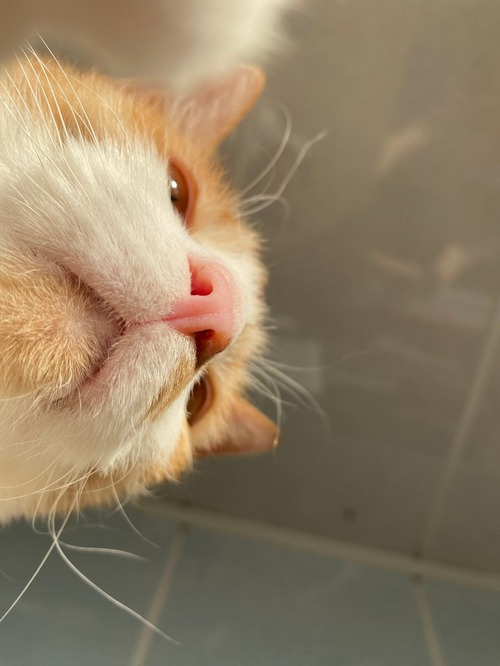